# CS294 - Project 2 - Part 2
Romil Bhardwaj

In [1]:
import numpy as np
import skimage as sk
import skimage.io as skio
import matplotlib.pyplot as plt
import matplotlib
from scipy.signal import convolve2d
from scipy.signal.windows import gaussian
from skimage.color import rgb2gray
from scipy.ndimage.interpolation import rotate
from skimage.transform import rescale, resize
from scipy.ndimage import gaussian_filter
import cv2
import os
from align_image_code import align_images

## 2.1 Sharpening Images

In [2]:
def get_gaussian(size, sigma):
    kernel = cv2.getGaussianKernel(size, sigma)
    return np.outer(kernel, np.transpose(kernel))

In [3]:
def sharpen(image, gaussian_kernel):
    unsharp_mask = np.zeros(gaussian_kernel.shape)
    gauss_size = gaussian_kernel.shape[0]
    unsharp_mask[gauss_size//2, gauss_size//2] = 2
    unsharp_mask -= gaussian_kernel
    channelwise_sharp = []
    for channel in range(image.shape[2]):
        s = convolve2d(image[:,:,channel], unsharp_mask, mode="same").reshape([image.shape[0], image.shape[1], 1])
        channelwise_sharp.append(s)
    sharpened_img = np.dstack(channelwise_sharp)
    return sharpened_img

def blur(image, gaussian_kernel):
    channelwise_blur = []
    for channel in range(image.shape[2]):
        s = convolve2d(image[:,:,channel], gaussian_kernel, mode="same").reshape([image.shape[0], image.shape[1], 1])
        channelwise_blur.append(s)
    blurred_img = np.dstack(channelwise_blur)
    return blurred_img

In [4]:
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 22})

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


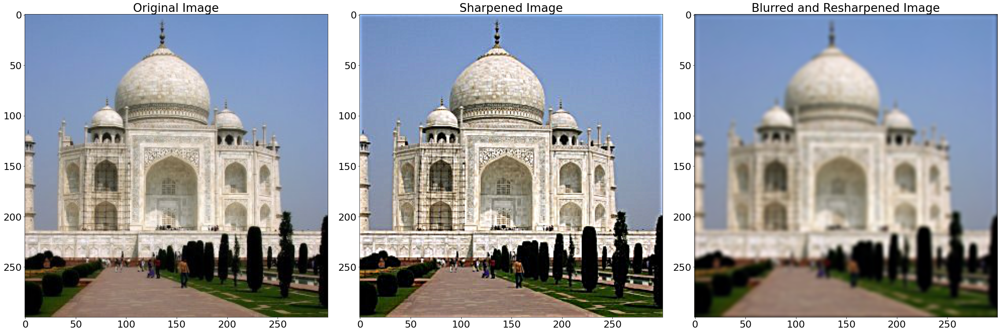

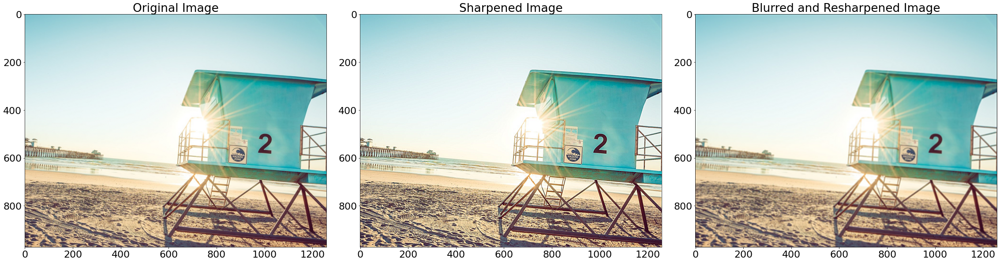

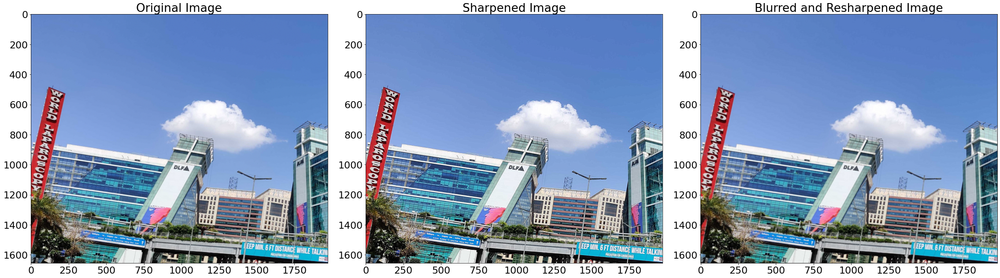

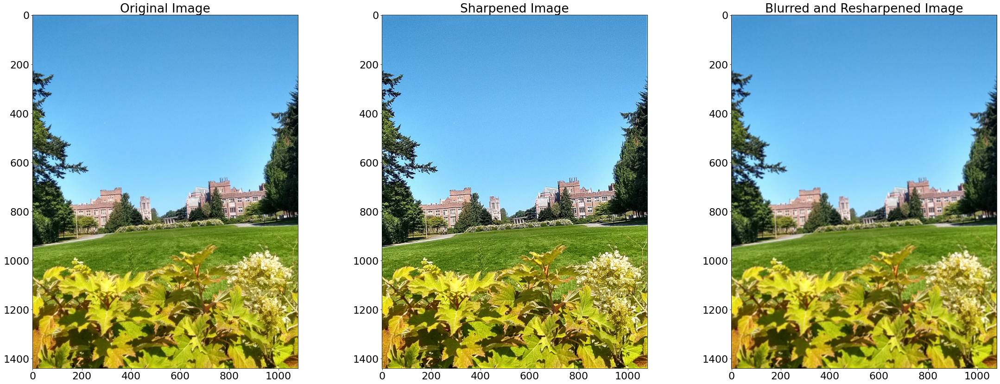

In [92]:
gaussian_kernel = get_gaussian(9, 2)
OUTPUT_PATH = 'outputs/sharpening'
os.makedirs(OUTPUT_PATH, exist_ok=True)
images = ['imgs/taj.jpg', 'imgs/beach.jpg', 'imgs/bldg.jpg', 'imgs/uwash.jpg']
for img_path in images:
    im = skio.imread(img_path)
    im = sk.img_as_float(im)
    # Regular sharpening
    sharpened_img = sharpen(im, gaussian_kernel)
    # Blur and sharpen again
    blur_resharp_img = sharpen(blur(im, gaussian_kernel), gaussian_kernel)
    
    nrow = 1; ncol = 3;
    fig, axs = plt.subplots(nrows=nrow, ncols=ncol, figsize=(32, 12))
    axs = axs.reshape(-1)
    
    ax = axs[0]
    ax.set_title('Original Image')
    ax.imshow(im)
    
    ax = axs[1]
    ax.set_title('Sharpened Image')
    ax.imshow(sharpened_img)
    
    ax = axs[2]
    ax.set_title('Blurred and Resharpened Image')
    ax.imshow(blur_resharp_img)
    
    # Save output
    name = os.path.splitext(os.path.basename(img_path))[0]
    out_filename = 'sharpened_' + name + '.jpeg'
    out_path = os.path.join(OUTPUT_PATH, out_filename)
    plt.tight_layout()
    plt.savefig(out_path, bbox_inches='tight')

# 2.3 Hybrid Images
### Implemented in p2_22hybrid.py

# 2.4 Laplacian and Gaussian Stacks

In [5]:
def gaussian_stack(im, gaussian_kernel, stack_depth=7):
    stack = []
    blurred_image = im.copy()
    for i in range(stack_depth-1):
        blurred_image = blur(blurred_image.copy(), gaussian_kernel)
        stack.append(blurred_image)
    return [im] + stack

def laplacian_stack(im, gaussian_kernel, stack_depth=7):
    stack = []
    g_stack = gaussian_stack(im, gaussian_kernel, stack_depth)
    last_image = im.copy()
    for i in range(1, stack_depth):
        high_freq = (last_image - g_stack[i])
        stack.append(high_freq)
        last_image = g_stack[i].copy()
    return [im] + stack

def plot_stack(s, title='', save_path=''):
    nrow = 1; ncol = len(s);

    fig, axs = plt.subplots(nrows=nrow, ncols=ncol, figsize=(5*ncol, 12))
    axs = axs.reshape(-1)

    for i, ax in enumerate(axs):
        ax.set_title(f'{title} depth = {i}')
        ax.imshow(s[i])
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

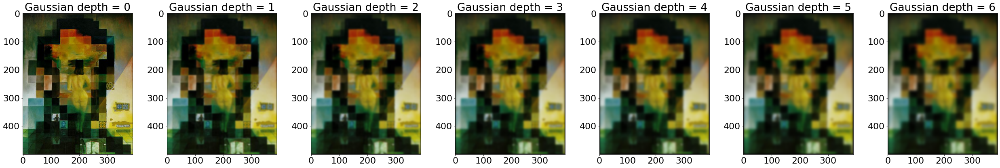

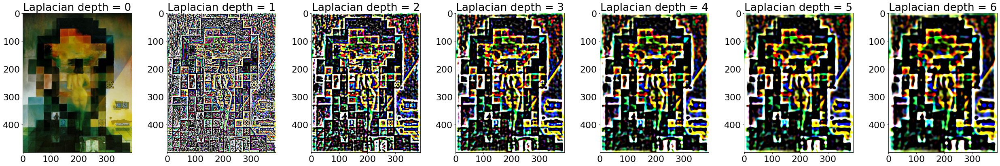

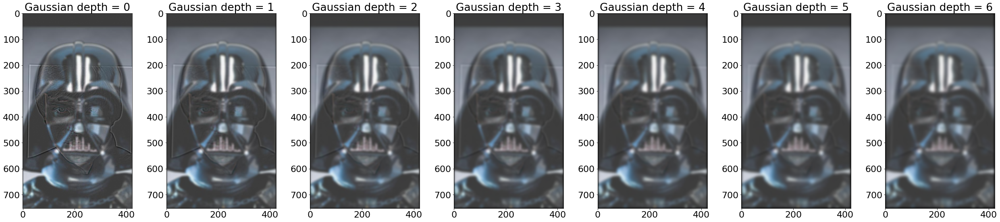

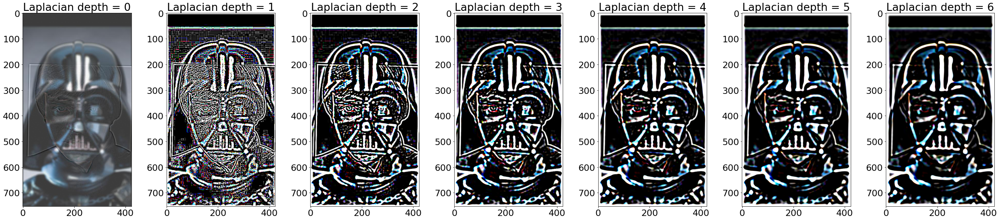

In [65]:
OUTPUT_PATH = 'outputs/stacks'
os.makedirs(OUTPUT_PATH, exist_ok=True)
imgs = ['imgs/lincoln.jpg', 'outputs/hybrid/lukevader.jpg']
for img_path in imgs:
    im = skio.imread(img_path)
    im = sk.img_as_float(im)
    gaussian_kernel = get_gaussian(15, 2)
    stack_depth = 7

    gauss_stack = gaussian_stack(im, gaussian_kernel, stack_depth)
    lapl_stack = laplacian_stack(im, gaussian_kernel, stack_depth)
    lapl_stack = [lapl_stack[0]] + [lapl*255 for lapl in lapl_stack[1:]] # Mult by 255 to fix imshow

    name = os.path.splitext(os.path.basename(img_path))[0]
    out_filename = 'gaussstack_' + name + '.jpeg'
    out_path = os.path.join(OUTPUT_PATH, out_filename)
    plot_stack(gauss_stack, "Gaussian", out_path)

    out_filename = 'laplstack_' + name + '.jpeg'
    out_path = os.path.join(OUTPUT_PATH, out_filename)
    plot_stack(lapl_stack, "Laplacian", out_path)

# Part 2.4 - Multiresolution Blending

In [6]:
# def get_thresholded_mask()

def blending(im1, im2, mask, gaussian_kernel, depth=5, mask_threshold = 0.3):
    mask = rgb2gray(mask)
    mask = mask > mask_threshold
    mask = np.dstack([mask, mask, mask]).astype(np.float32)
    mask_stack = gaussian_stack(mask, gaussian_kernel, depth)
    im1_stack = laplacian_stack(im1, gaussian_kernel, depth)
    im2_stack = laplacian_stack(im2, gaussian_kernel, depth)
    #plot_stack(im2_stack, "im2_stack", '')
    stacked_imgs = []
    for i in range(depth):
        stacked_imgs.append(mask_stack[i]*im1_stack[i] + (1 - mask_stack[i])*im2_stack[i])
    return sum(stacked_imgs), im1_stack, im2_stack, mask_stack

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

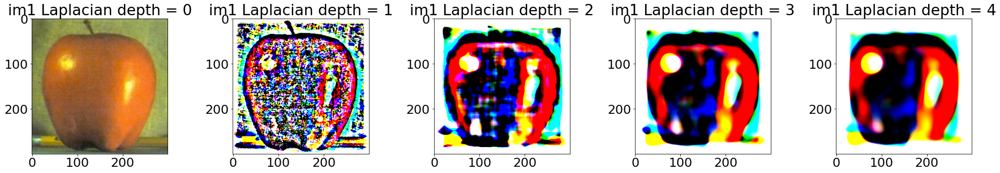

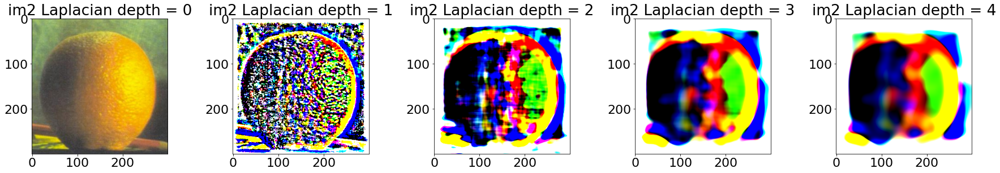

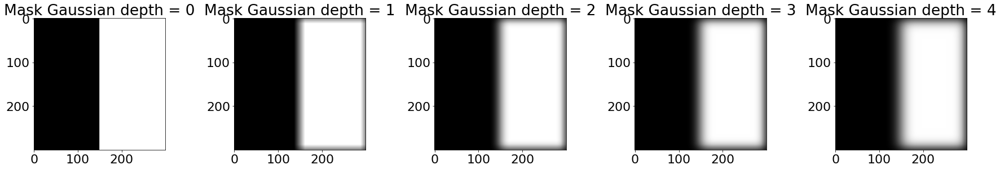

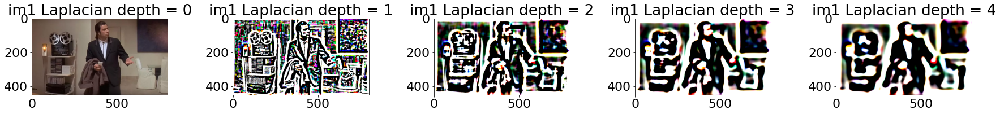

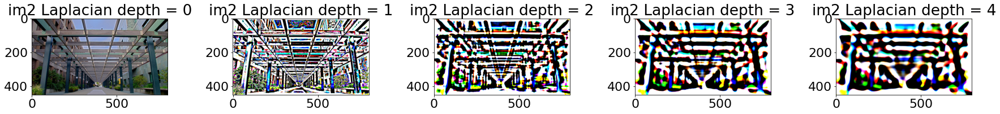

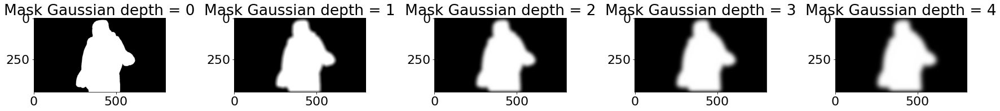

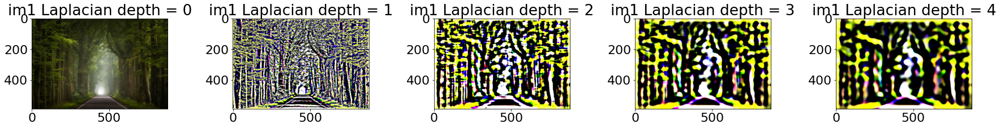

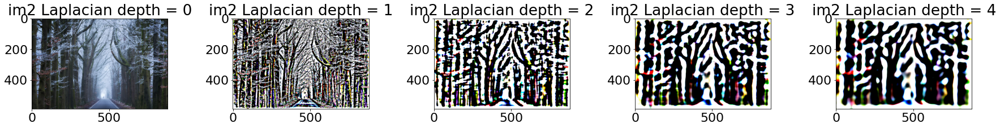

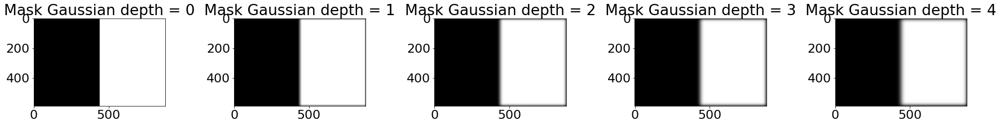

In [7]:
OUTPUT_PATH = 'outputs/multires/'
os.makedirs(OUTPUT_PATH, exist_ok=True)
gaussian_kernel = get_gaussian(25, 20)

imgs = [['imgs/apple.jpeg', 'imgs/orange.jpeg', 'imgs/oraple_mask.jpg'],
       ['imgs/travolta.jpg', 'imgs/sodahall.jpg', 'imgs/travolta_mask.jpg'],
       ['imgs/summer.jpg', 'imgs/winter.jpg', 'imgs/season_mask.jpg'],]
for im1_path, im2_path, mask_path in imgs:
    im1 = skio.imread(im1_path)
    im2 = skio.imread(im2_path)
    mask = skio.imread(mask_path)

    stacked, im1_stack, im2_stack, mask_stack = blending(im1, im2, mask, gaussian_kernel, depth=5)

    name = os.path.splitext(os.path.basename(im1_path))[0]
    out_path = os.path.join(OUTPUT_PATH, 'im1stack_' + name + '.jpeg')
    plot_stack(im1_stack, "im1 Laplacian", out_path)

    out_path = os.path.join(OUTPUT_PATH, 'im2stack_' + name + '.jpeg')
    plot_stack(im2_stack, "im2 Laplacian", out_path)

    out_path = os.path.join(OUTPUT_PATH, 'maskstack_' + name + '.jpeg')
    plot_stack(mask_stack, "Mask Gaussian", out_path)